In [1]:
import sys
!{sys.executable} -m pip install scipy seaborn scikit-learn plotly

ERROR: Could not find a version that satisfies the requirement scipy (from versions: none)

[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: D:\TalentoTech\Python\Titanic\venv\Scripts\python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for scipy


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from scipy.stats import skew

ModuleNotFoundError: No module named 'scipy'

In [ ]:
if not hasattr(np, "unicode_"):
    np.unicode_ = np.str_

In [ ]:
import plotly.express as px

In [ ]:
data = pd.read_csv("hotel_bookings.csv")
month_order = ['January','February','March','April','May','June',
               'July','August','September','October','November','December']

In [ ]:
data['arrival_date_month'] = pd.Categorical(data['arrival_date_month'], 
                                           categories=month_order, 
                                           ordered=True)

In [ ]:
data.head()

In [ ]:
nan_count = data.isna().sum().reset_index().rename(columns = {0: "NaN","index":"columns"}).sort_values(by = "NaN", ascending = False)
nan_count

In [ ]:
data.describe()

In [ ]:
fig = px.bar(nan_count, x = "columns", y = "NaN", title = "NaN por columnas",
            width = 1300,
            height = 500)
fig.show()


In [ ]:
#list(set(data.company))

In [ ]:
#list(set(data.agent))

In [ ]:
data.shape

In [ ]:
warnings.filterwarnings('ignore', category=FutureWarning)

## De donde vienen los huespedes

In [ ]:
d1 = data.groupby(
    ['hotel', 'country', 'arrival_date_year', 'arrival_date_month'], 
    observed=True  # Configurar explícitamente para evitar advertencias
).size().reset_index(name='total')

# Crear el gráfico de Sunburst
fig = px.sunburst(
    d1,
    path=['hotel', 'country', 'arrival_date_year', 'arrival_date_month'],  # Definir la jerarquía
    values='total',  # Usar la columna 'total' como tamaño
    title='Distribución de huéspedes por hotel, país de origen, año y mes',
    width=1000,
    height=1000
)


## Gráfico Sunburst

In [ ]:
fig.show()

## Cuánto pagan los huéspedes por una habitación por noche en promedio?

In [ ]:
fig = px.box(
    data,
    x='hotel',  # Tipo de hotel
    y='adr',  # Precio promedio por noche
    title='Distribución del precio por habitación (ADR) por tipo de hotel',
    width=800,
    height=600,
    color='hotel'
)

# Ajustes de título de ejes
fig.update_layout(
    xaxis_title='Tipo de hotel',
    yaxis_title='Precio promedio por noche (ADR)'
)
fig.show()

In [ ]:
skewness_by_hotel = data.groupby('hotel')['adr'].apply(lambda x: skew(x.dropna())).reset_index()
skewness_by_hotel.rename(columns={'adr': 'skewness'}, inplace=True)


In [ ]:
print("Sesgo por hotel:")
print(skewness_by_hotel)


In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(data=data, x='adr', hue='hotel', kde=True, bins=50, element='step', palette='Set2')
plt.title('Distribución del ADR (precio promedio por noche) por hotel', fontsize=16)
plt.xlabel('ADR (precio promedio por noche)', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)
plt.axvline(x=0, color='gray', linestyle='--', label='ADR = 0')
plt.legend(title='Hotel', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
print(data[data['adr'] <= 0])

In [ ]:
fig.update_layout(
    xaxis_title='Tipo de hotel',
    yaxis_title='Precio promedio por noche (ADR)',
    legend_title='Categoría de hotel',  # Título personalizado para la leyenda
    legend=dict(
        orientation="v",  # Leyenda vertical
        x=1,  # Posición en el eje X (1 = derecha)
        y=1,  # Posición en el eje Y (1 = arriba)
        bgcolor='rgba(255, 255, 255, 0.5)',  # Fondo semitransparente
        bordercolor='black',  # Color del borde
        borderwidth=1         # Grosor del borde
    )
)


## Cómo varía el precio por noche durante el año

In [ ]:
fig1 = px.box(    
    data,
    x='arrival_date_year',
    y='adr',
    color='hotel',
    title='Distribución del precio por habitación (ADR) por hotel y año',
    width=700,
    height=600,    
)

# Calcular el promedio por grupo (hotel y año de llegada)
promedios = data.groupby(['arrival_date_year', 'hotel'])['adr'].mean().reset_index()

# Agregar una traza al gráfico para destacar los promedios
for hotel in promedios['hotel'].unique():
    hotel_promedios = promedios[promedios['hotel'] == hotel]
    fig1.add_scatter(
        x=hotel_promedios['arrival_date_year'],
        y=hotel_promedios['adr'],
        mode='markers+lines',
        name=f'Promedio - {hotel}',
        marker=dict(size=8, symbol='circle', line=dict(width=2)),
    )

fig1.update_layout(
    xaxis_title='Año de llegada',
    yaxis_title='Precio promedio por noche (ADR)'
)

fig1.show()

In [ ]:
print(data['hotel'].unique())

In [ ]:
print(data.groupby('hotel')['adr'].count())

In [ ]:
print(data[data['hotel'] == 'Resort Hotel']['adr'].describe())
print(data[data['hotel'] == 'City Hotel']['adr'].describe())

## Gráfico boxplot por hotel y mes

In [ ]:
import plotly.express as px

fig2 = px.box(
    data,
    x='arrival_date_month',  # Meses en el eje X
    y='adr',                 # Precio en el eje Y
    color='hotel',           # Diferenciar por hotel
    title='Distribución del precio por habitación (ADR) por hotel y mes',
    width=900,
    height=600
)

fig2.update_layout(
    xaxis_title='Mes de llegada',
    yaxis_title='Precio promedio por noche (ADR)',
    xaxis=dict(categoryorder='array',  # Ordenar meses correctamente
               categoryarray=[
                   'January', 'February', 'March', 'April', 'May', 'June',
                   'July', 'August', 'September', 'October', 'November', 'December'
               ])
)

fig2.show()



## Distribución por hotel y mes, ajustando los datos

In [ ]:
data['arrival_date_month'] = pd.Categorical(data['arrival_date_month'], categories=month_order, ordered=True)

adr_threshold = 500  # Ajustar según el valor máximo esperado de ADR
data_clean = data[data['adr'] <= adr_threshold]

# Crear el gráfico de boxplot
fig2 = px.box(
    data_clean,
    x='arrival_date_month',
    y='adr',
    color='hotel',
    title='Distribución del precio por habitación (ADR) por hotel y por mes',
    width=1000,
    height=600
)

# Ajustar títulos de los ejes
fig2.update_layout(
    xaxis_title='Mes de llegada',
    yaxis_title='Precio promedio por noche (ADR)'
)

# Mostrar el gráfico
fig2.show()


In [ ]:
fig = px.box(
    data,
    x = 'arrival_date_month',
    y = "adr",
    color = 'hotel',
    facet_col ='arrival_date_year',
    title = 'Distribución del precio por habitación (ADR) por hotel, año y mes',
    width = 1200,
    height = 600,
)
fig.update_layout(
    xaxis_title = 'mes de llegada',
    yaxis_title = 'precio promedio por noche (ADR',
    boxmode = 'group' # Agregar los boxplot
)
fig.show()

In [ ]:
d2 = data[['hotel','arrival_date_year','arrival_date_month', 'adr']].groupby(['hotel','arrival_date_year','arrival_date_month']).median().reset_index()
fig = px.sunburst(
    d2,
    path = ['hotel','arrival_date_year','arrival_date_month'],
    values = 'adr',
    title = 'Precio promedio por noche, por hotel, anio y mes',
    width = 1000,
    height = 900
)
fig.show()

## Cuáles son los meses mas ocupados?

In [ ]:
d3 = data.query('is_canceled == 0').reset_index(drop = True)
d31 = d3.groupby(['hotel','arrival_date_year','arrival_date_month']).size().reset_index().rename(columns = {0:'Ocupacion'})
d32 = d3.groupby('arrival_date_month').size().reset_index().rename(columns = {0: 'total'})
d33 = d3.groupby(['arrival_date_month']).size().reset_index().rename(columns = {0: 'total'})

In [ ]:
fig_donut = px.pie(
    d32,
    names = 'arrival_date_month',
    values = 'total',
    title = 'Distribución de reservas por mes',
    hole = 0.4
    
)
fig_donut.show()

In [ ]:
fig.show()

In [ ]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

d31['arrival_date_month'] = pd.Categorical(
    d31['arrival_date_month'],
    categories = month_order,
    ordered = True
)#box plot por mes
fig_boxplot_mes = px.box(
    d31,
    x = 'arrival_date_month',
    y = 'Ocupacion',
    title = 'Distribución de ocupación por mes (reservas efectivas)',
    width = 800,
    height = 600
    
)
fig_boxplot_mes.update_layout(
    xaxis_title = 'Mes',
    yaxis_title = 'Ocupación',
    
)
fig_boxplot_mes.show()

fig_boxplot_anio_mes = px.box(
    d31,
    x = 'arrival_date_month',
    y = 'Ocupacion',
    color = 'arrival_date_year',
    title = 'Distribución de ocupación por año y mes (reservas efectivas)',
    width = 800, 
    height = 600
    
)
fig_boxplot_anio_mes.update_layout(
    xaxis_title = 'Mes',
    yaxis_title = 'Ocupación',
    boxmode = 'group'
)
fig_boxplot_anio_mes.show()

fig_boxplot_hotel_mes = px.box(
    d31, 
    x = 'arrival_date_month',
    y = 'Ocupacion',
    color = 'hotel',
    title = 'Distribución de ocupación por hotel y mes (reservas efectivas)',
    width = 800,
    height = 600

)
fig_boxplot_hotel_mes.update_layout(
    xaxis_title = 'Mes',
    yaxis_title = 'Ocupacion',
    boxmode = 'group'

)
fig_boxplot_hotel_mes.show()

## Cuánto se queda la gente en los hoteles?

In [46]:
d4 = data[['hotel', 'arrival_date_year', 'arrival_date_month', 'stays_in_weekend_nights', 'stays_in_week_nights']].copy()

# Definir el orden de los meses
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

# Convertir la columna 'arrival_date_month' a categórica con un orden definido
#print(d4['arrival_date_month'].unique())
d4['arrival_date_month'] = pd.Categorical(
    d4['arrival_date_month'],
    categories = month_order,
    ordered = True  
)
d4 = d4.sort_values(by='arrival_date_month')



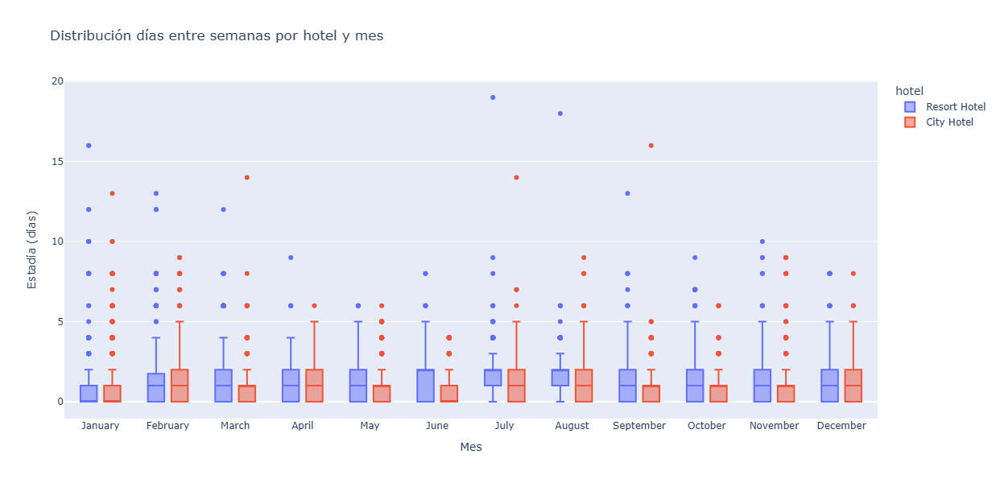

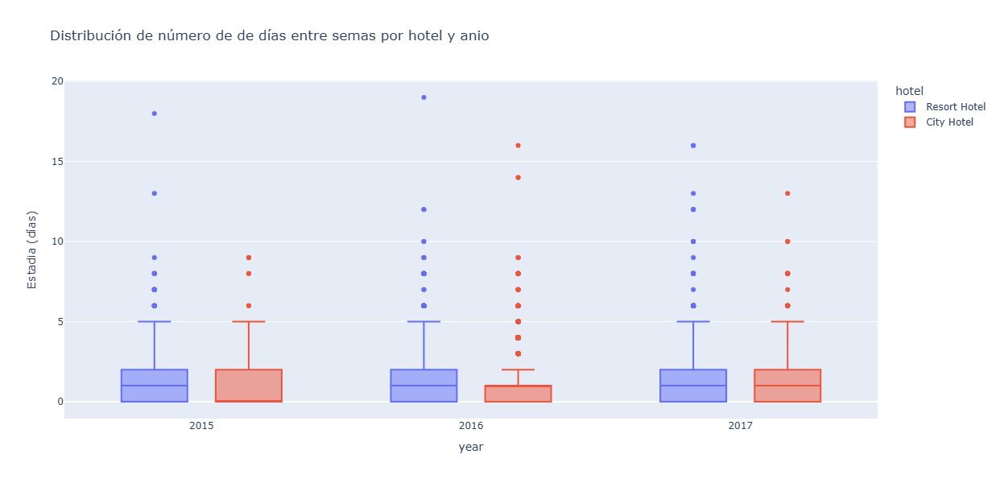

In [47]:
fig = px.box(
    d4,
    x = 'arrival_date_month',
    y = 'stays_in_weekend_nights',
    color = 'hotel',
    title = 'Distribución días entre semanas por hotel y mes',
    width = 1200,
    height = 600,
    category_orders={'arrival_date_month': month_order}
)
fig.update_layout(
    xaxis_title = 'Mes',
    yaxis_title = 'Estadía (días)',
    boxmode = 'group'

)
fig.show()
fig= px.box(
    d4,
    x = 'arrival_date_year',
    y = 'stays_in_weekend_nights', 
    color = 'hotel',
    title = 'Distribución de número de de días entre semas por hotel y anio',
    width = 1000,
    height = 600
)
fig.update_layout(
    xaxis_title = 'year',
    yaxis_title = 'Estadia (días)',
    boxmode = 'group'
)
fig.show()


## Reservas por segmento de mercado

In [57]:
d5 = data.groupby(['hotel','arrival_date_year','arrival_date_month','market_segment', 'is_canceled']).size().reset_index().rename(columns = {0:'total'})

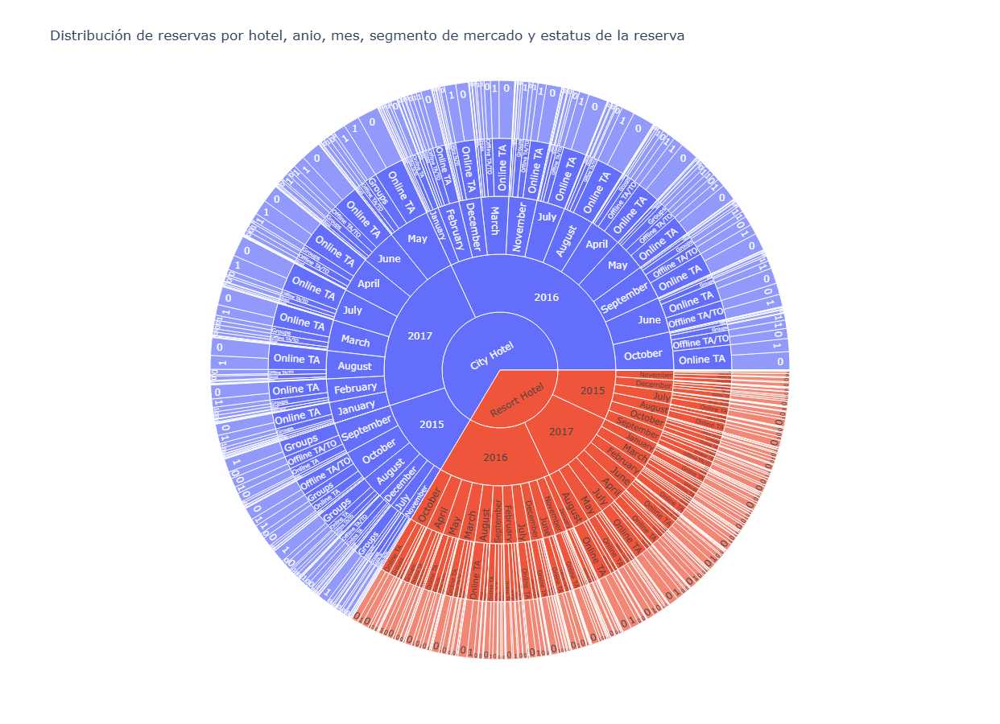

In [66]:
fig = px.sunburst(
    d5, path =['hotel','arrival_date_year','arrival_date_month', 'market_segment', 'is_canceled'],
    values = 'total',
    title = 'Distribución de reservas por hotel, anio, mes, segmento de mercado y estatus de la reserva',
    width = 900,
    height = 900
)
fig.show()

## Cuántas reservas se cancelaron?

In [61]:
d6 = data.query('is_canceled == 1').groupby(['hotel','arrival_date_year', 'arrival_date_month', 'market_segment']).size().reset_index().rename(columns ={0: 'total'})

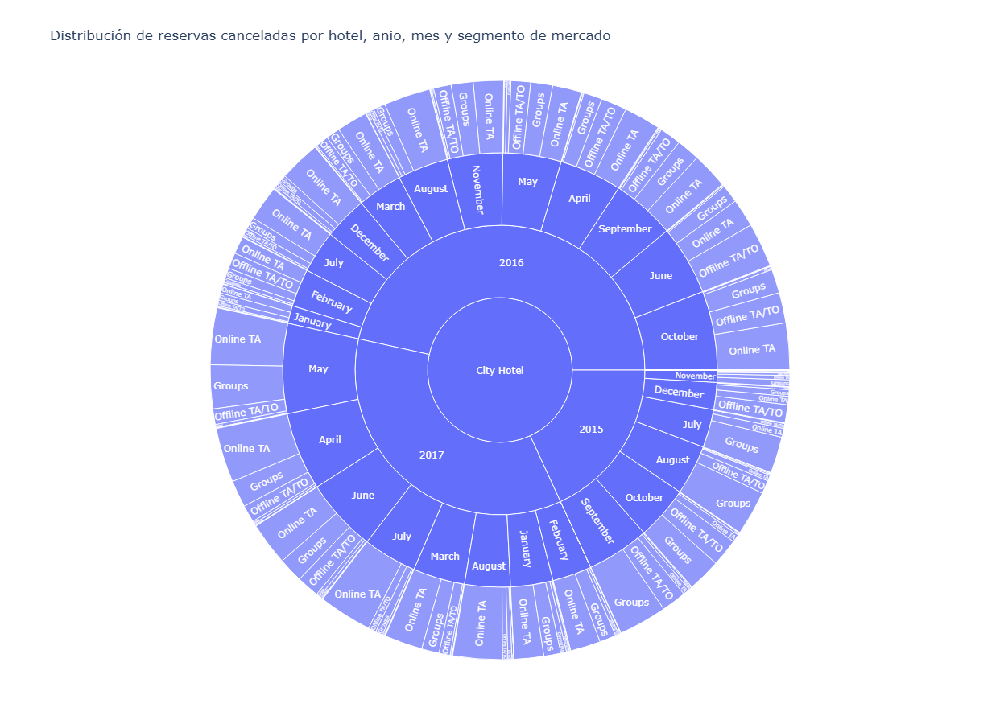

In [63]:
fig = px.sunburst(
    d6, 
    path = ['hotel', 'arrival_date_year','arrival_date_month', 'market_segment'],
    values = 'total',
    title = 'Distribución de reservas canceladas por hotel, anio, mes y segmento de mercado',
    width = 1000,
    height = 900
)
fig.show()

## Qué mes tiene el mayor número de cancelaciones

In [64]:
d7 = data.query('is_canceled == 1 ').groupby(['arrival_date_month']).size().reset_index().rename(columns = {0:'total'})

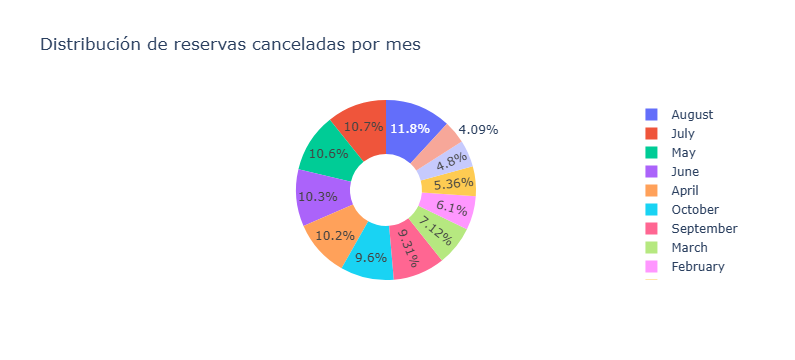

In [65]:
fig_donut = px.pie(
    d7,
    names = 'arrival_date_month',
    values = 'total',
    title = 'Distribución de reservas canceladas por mes',
    hole = .4
)
fig_donut.show()

In [67]:
print('Diego')

Diego
